In [ ]:
!pip install Unidecode
!pip install fuzzysearch

!pip install elementpath
!pip install lxml 
!pip install graphviz
!pip install pydotplus

In [1]:
!ls ../../edspdf-train/data/publaynet/

dev.json xmls


# Sorting lines based on the xml files

In [1]:
from sort_xml import *
base_dir = '../../edspdf-train/data/publaynet/'

%load_ext autoreload
%autoreload 2

import sys
sys.executable

'/Users/souleymbaye/opt/anaconda3/envs/eds_env/bin/python'

### Load pdf and xml example 

In [115]:
!ls ../../edspdf-train/data/publaynet/xmls | head -n +25

PMC1087887
PMC1087888
PMC1241820
PMC1247186
PMC1247188
PMC1247189
PMC1247474
PMC1247478
PMC1247480
PMC1247485
PMC1247515
PMC1247517
PMC1247523
PMC1247562
PMC1247569
PMC1247570
PMC1247573
PMC1247606
PMC1247607
PMC1247608
PMC1247616
PMC1247620
PMC1247625
PMC1247658
PMC1247661


In [4]:
!ls ../../edspdf-train/data/publaynet/xmls/PMC1247517/

ehp0112-001282.nxml  ehp0112-001282e2.jpg ehp0112-001282f2.gif
ehp0112-001282.pdf   ehp0112-001282f1.gif ehp0112-001282f2.jpg
ehp0112-001282e1.jpg ehp0112-001282f1.jpg


In [ ]:
PMC1247562 # exellent
PMC1247569 # exell b-37 --> (now ok)
PMC1247570 # title twice b-16, b-23
PMC1247573 # front, body et tables perfect
PMC1247606 # between b-7 and b-8, two missing nodes in the xml
PMC1247607 # body et tables perfect
PMC1247608
PMC1247616
PMC1280340 # body et tables perfect
PMC1247620 # 6min trop long
PMC1247625 # perfect (0 table)
PMC1247658 # 3min

In [47]:
file_dir = base_dir + 'xmls/PMC1247658'
pdf_path, xml_path = get_paths(file_dir = file_dir)
print(f'xml path: {xml_path}\npdf path: {pdf_path}')


xml path: ../../edspdf-train/data/publaynet/xmls/PMC1247658/ehp0112-001614.nxml
pdf path: ../../edspdf-train/data/publaynet/xmls/PMC1247658/ehp0112-001614.pdf


## Model extractor

In [48]:
from edspdf import Pipeline
from edspdf.structures import Box, PDFDoc
from edspdf.visualization.annotations import show_annotations

# model
model = Pipeline()
model.add_pipe("pdfminer-extractor", config=dict(extract_style="true"), name="extractor")

# Read PDF
pdf = pdf_path.read_bytes()
doc: PDFDoc = model.get_pipe("extractor")(pdf)

dict_page_text_boxes = {}
for tb in doc.content_boxes:
    if tb.page_num not in dict_page_text_boxes:
        dict_page_text_boxes[tb.page_num] = []
    dict_page_text_boxes[tb.page_num].append(tb)
print(f'Nb pages {len(dict_page_text_boxes)}')
# pages = [page for page in show_annotations(doc.content, doc.content_lines)]
# for page in show_annotations(doc.content, doc.content_boxes):
#     display(page)

Nb pages 8


#### Display XML

In [49]:
# Read XML
xml = open(xml_path, 'rb')
tree = etree.parse(xml)
# root = tree.getroot()

printXML(tree)

<!DOCTYPE article PUBLIC "-//NLM//DTD JATS (Z39.96) Journal Archiving and Interchange DTD v1.0 20120330//EN" "JATS-archivearticle1.dtd">
<article xmlns:xlink="http://www.w3.org/1999/xlink" xmlns:mml="http://www.w3.org/1998/Math/MathML" article-type="research-article">
  <?properties open_access?>
  <front>
    <journal-meta>
      <journal-id journal-id-type="nlm-ta">Environ Health Perspect</journal-id>
      <journal-id journal-id-type="iso-abbrev">Environ. Health Perspect</journal-id>
      <journal-title-group>
        <journal-title>Environmental Health Perspectives</journal-title>
      </journal-title-group>
      <issn pub-type="ppub">0091-6765</issn>
      <issn pub-type="epub">1552-9924</issn>
      <publisher>
        <publisher-name>National Institue of Environmental Health Sciences</publisher-name>
      </publisher>
    </journal-meta>
    <article-meta>
      <article-id pub-id-type="pmid">15598612</article-id>
      <article-id pub-id-type="pmc">1247658</article-id>
    

#### Font, Body and tables text nodes

##### Front nodes matching

In [51]:
xml_front_nodes = get_front_nodes(tree)

print(f'\n\nNb nodes {len(xml_front_nodes)}')
for id,xml_node in enumerate(xml_front_nodes):
    printXML(xml_node)

front_nodes = []
for id,xml_node in enumerate(xml_front_nodes):
    node = Node(xml_node, id, color='yellow', bg_color='black', r0='f', entropie_threshold=0.1)
    front_nodes.append(node)
    
front_nodes = tqdm(front_nodes, mininterval=1)



Nb nodes 5
<article-title xmlns:xlink="http://www.w3.org/1999/xlink" xmlns:mml="http://www.w3.org/1998/Math/MathML">The TAO-Gen Algorithm for Identifying Gene Interaction Networks with Application to SOS Repair in <italic>E. coli</italic></article-title>

<contrib-groups>
  <new-name>
    <given-names>Takeharu</given-names>
    <surname>Yamanaka</surname>
  </new-name>
  <new-name>
    <given-names>Hiroyoshi</given-names>
    <surname>Toyoshiba</surname>
  </new-name>
  <new-name>
    <given-names>Hideko</given-names>
    <surname>Sone</surname>
  </new-name>
  <new-name>
    <given-names>Frederick M.</given-names>
    <surname>Parham</surname>
  </new-name>
  <new-name>
    <given-names>Christopher J.</given-names>
    <surname>Portier</surname>
  </new-name>
</contrib-groups>

<affs>
  <aff id="af1-ehp0112-001614"><sup>1</sup>Laboratory of Computational Biology and Risk Analysis, National Institute of Environmental Health Sciences, National Institutes of Health, Department of Healt

  0%|          | 0/5 [00:00<?, ?it/s]

In [56]:
for tb in doc.content_boxes:
    tb.rank = None
    tb.inode = None

In [57]:
for node in front_nodes:
    node.reset()

get_matches(front_nodes, dict_page_text_boxes, v=False)

In [58]:
n_tt = len(front_nodes)
n_mt = len([0 for node in front_nodes if node.full])
print(f'Front\n  Nb nodes total {n_tt}\n  Nb nodes matched {n_mt}\n  Nb nodes not matched {n_tt-n_mt}')
for node in front_nodes:
    if not node.full:
        print(f'    {node.id}  `{node.text}`')

Front
  Nb nodes total 5
  Nb nodes matched 5
  Nb nodes not matched 0


In [191]:
# id = 0
# for node in front_nodes:
#     if node.id == id:
#         break

# node.print_node()

Nb blocs 1
Node (0 complete) text: `Benchmark Calculations for Perchlorate from Three Human Cohorts`
complete bloc
  Id 0 nb tbs 1
  Text: `Benchmark Calculations for Perchlorate from Three Human Cohorts`
     0 p-0 `Benchmark Calculations for Perchlorate from Three Human Cohorts` 		-> [Match(start=0, end=56, dist=0, matched='BenchmarkCalculationsforPerchloratefromThreeHumanCohorts')] TextBox(x0=0.0784313725490196, x1=0.8142503267973861, y0=0.080567297979798, y1=0.09824406565656563, label=None, page_num=0, text='Benchmark Calculations for Perchlorate from Three Human Cohorts', props=[TextProperties(italic=False, bold=True, begin=0, end=63, fontname='NJGHCB+Univers-Bold')])


##### Body nodes matching

In [9]:
# executer une seule fois sionon erreur
# moins de noeuds retournes

qbody='//body//title | //body//p'
r = elementpath.select(tree, qbody)
r2 = []

jump = False
for i,node in enumerate(r):
    if jump:
        jump = False
        continue
    if node.tag == 'title' and r[1+i].tag == 'p':
        sec = etree.Element('sec')
        sec.append(node)
        sec.append(r[1+i])
        r2.append(sec)
        jump = True
    else:
        r2.append(node)

xml_body_nodes = r2

body_nodes = []
for id, xml_node in enumerate(xml_body_nodes):
    node = Node(xml_node, id, color='black', bg_color='cyan', r0='b')
    body_nodes.append(node)
body_nodes = tqdm(body_nodes, mininterval=1)

  0%|          | 0/34 [00:00<?, ?it/s]

In [10]:
for node in body_nodes:
    node.reset()

get_matches(body_nodes, dict_page_text_boxes, v=False)

100%|██████████| 34/34 [00:02<00:00, 14.10it/s]


In [11]:
n_tt = len(body_nodes)
n_mt = len([0 for node in body_nodes if node.full])
print(f'Body\n  Nb nodes total {n_tt}\n  Nb nodes matched {n_mt}\n  Nb nodes not matched {n_tt-n_mt}')
for node in body_nodes:
    if not node.full:
        print(f'    {node.id}  `{node.text}`')

Body
  Nb nodes total 34
  Nb nodes matched 34
  Nb nodes not matched 0


Introduction

Contex
Datset
Model


In [59]:
inode_copy = []
for tb in doc.content_boxes:
    inode_copy.append(tb.inode)

In [195]:
# id = 3
# for node in body_nodes:
#     if node.id == id:break
# printXML(node.xml_node)
# node.print_node()

<p xmlns:xlink="http://www.w3.org/1999/xlink" xmlns:mml="http://www.w3.org/1998/Math/MathML">“Inhibition of iodide uptake by the thyroid clearly is not an adverse effect.”</p>

Nb blocs 2
Node (3 complete) text: `"Inhibition of iodide uptake by the thyroid clearly is not an adverse effect."`
complete bloc
  Id 0 nb tbs 2
  Text: `* "Inhibition of iodide uptake by the thyroid - clearly is not an adverse effect."`
     0 p-0 `* "Inhibition of iodide uptake by the thyroid` 		-> [Match(start=0, end=37, dist=1, matched='"Inhibitionofiodideuptakebythethyroid')] TextBox(x0=0.36655761764705885, x1=0.6334427630718954, y0=0.4666380681818185, y1=0.478633017676768, label=None, page_num=0, text='• “Inhibition of iodide uptake by the thyroid', props=[TextProperties(italic=False, bold=False, begin=0, end=45, fontname='NJGHBA+AGaramond-Regular')])
     1 p-0 `clearly is not an adverse effect."` 		-> [Match(start=37, end=66, dist=0, matched='clearlyisnotanadverseeffect."')] TextBox(x0=0.376362021241830

##### Tables nodes matching

In [60]:
# one execution

qtables='//table-wrap'
tables_nodes=elementpath.select(tree, qtables)


qtable='//label | //caption | //tr | //table-wrap-foot'
xml_table_nodes = [
    [
        node for node in one_tns if "".join(node.itertext()) != ""
    ]
    for one_tns in [elementpath.select(table_tree, qtable) for table_tree in tables_nodes]
]

# Merging label and caption
for itable in range(len(xml_table_nodes)):
    label = None
    caption = None
    lc = None
    for ind,node in enumerate(xml_table_nodes[itable]):
        if node.tag == 'label':
            label = (ind,node)
        if node.tag == 'caption':
            caption = (ind,node)
        if label is not None and caption is not None:
            lc = etree.Element('label_caption')
            lc.append(deepcopy(label[1]))
            lc.append(deepcopy(caption[1]))
            xml_table_nodes[itable][label[0]] = lc
            xml_table_nodes[itable] = xml_table_nodes[itable][:caption[0]] + xml_table_nodes[itable][1+caption[0]:]
            break

# delete other label tags
table_nodes_ = []
for table in xml_table_nodes:
    tk_nodes = []
    for node in table:
        if node.tag != 'label':
            tk_nodes.append(node)
    table_nodes_.append(tk_nodes)
    
xml_table_nodes = table_nodes_

table_nodes = []
for itable,xml_t in enumerate(xml_table_nodes):
    t_nodes = []
    for id,xml_node in enumerate(xml_t):
        node = Node(xml_node, id, color='red', bg_color='white', r0=f't{itable}-')
        t_nodes.append(node)
    t_nodes = tqdm(t_nodes, mininterval=1)
    table_nodes.append(t_nodes)

  0%|          | 0/32 [00:00<?, ?it/s]


In [201]:
# itable = 0
# print(f'Nb nodes of table {itable}: {len(xml_table_nodes[itable])}\n')
# for inode,node in enumerate(xml_table_nodes[itable]):
#     print(f'{node.tag} {inode}\n  `{" | ".join(node.itertext())}`\n')
#     # printXML(node)
#     print('------------------')

Nb nodes of table 0: 5

label_caption 0
  `Table 1 | Summary of levels of hierarchical model.`

------------------
tr 1
  `Level | Data | Modeling techniques | Modeled process`

------------------
tr 2
  `1 | Meteorology ambient monitor | Spatial statistical model | Spatial surface of ambient PM | 2.5 |  levels`

------------------
tr 3
  `2 | Demographics activity patterns | Exposure simulator | Population exposure levels`

------------------
tr 4
  `3 | Mortality confounders | Poisson GAM | Cardiovascular mortality`

------------------


In [65]:
# backup tb.inode
for tb,inode in zip(doc.content_boxes, inode_copy):
    tb.inode = inode
    if inode is None:
        tb.rank = None

In [66]:

# for ic,tb in zip(inode_copy,doc.content_boxes):
#     tb.inode = ic
for t_nodes in table_nodes:
    for node in t_nodes:
        node.reset()
    
    get_matches(t_nodes, dict_page_text_boxes, v=False)
    break

# itable = 0
# _tdb = get_matches(table_nodes[itable], dict_page_text_boxes, color='red', bg_color='white',v=False, r0=f't{itable}-')

Avant tri
  Nb blocs 61
  Node (4 not complete) text: `recF Activate 0.393 0.161 0.93`
  bloc 110
    Id 110 nb tbs 1
    Text: `1`
    merged ids: `{'1', '0'}`
       0 p-1 `1` 		-> [Match(start=19, end=20, dist=0, matched='1'), Match(start=21, end=22, dist=0, matched='1')] TextBox(x0=0.15787467320261434, x1=0.16277663398692807, y0=0.2806550505050507, y1=0.28823080808080825, label=None, page_num=1, text='1', props=[TextProperties(italic=False, bold=False, begin=0, end=1, fontname='BCCMOH+AGaramond-Regular')])
  bloc 111
    Id 111 nb tbs 1
    Text: `e`
    merged ids: `{'1'}`
       0 p-1 `e` 		-> [Match(start=1, end=2, dist=0, matched='e'), Match(start=11, end=12, dist=0, matched='e')] TextBox(x0=0.23211895424836604, x1=0.240493954248366, y0=0.27531186868686874, y1=0.28604419191919195, label=None, page_num=1, text='η', props=[TextProperties(italic=False, bold=False, begin=0, end=1, fontname='BCCFHC+Symbol')])
  bloc 112
    Id 112 nb tbs 1
    Text: `i`
    merged ids: `{'1', '2'}`


In [67]:
print(f'Nb tables {len(table_nodes)}')
for itable in range(len(table_nodes)):
    # itable = 0
    
    tk_nodes = table_nodes[itable]
    # tk_nodes_blocs, tk_dict_blocs = _tdb    #   table_dict_blocks[itable]

    n_tt = len(tk_nodes)
    n_mt = len([0 for node in tk_nodes if node.full])
    print(f'Table {itable}\n  Nb nodes total {n_tt}\n  Nb nodes matched {n_mt}\n  Nb nodes not matched {n_tt-n_mt}')
    for node in tk_nodes:
        if not node.full:
            print(f'    {node.id}  `{node.text}`')
    
    # break

Nb tables 3
Table 0
  Nb nodes total 32
  Nb nodes matched 29
  Nb nodes not matched 3
    18  `recF Activate 0.062 0.130 30.95`
    20  `umuDC Activate 1.007 0.093 0.00`
    22  `rpoH Activate 3.319 0.074 0.00`
Table 1
  Nb nodes total 20
  Nb nodes matched 17
  Nb nodes not matched 3
    13  `C 2,891 (72) 60 (1) 100 (2) 56 (1) 76 (2) 296 (7) 4 (0.1) 2,891 (72) 404 (10) 114 (3) 444 (11)`
    14  `D 3,086 (77) 76 (2) 96 (2) 48 (1) 48 (1) 164 (4) 8 (0.2) 3,086 (77) 328 (8) 149 (4) 365 (9)`
    15  `10 arrays A 3,198 (32) 909 (9) 741 (7) 230 (2) 149 (2) 328 (3) 497 (5) 3,198 (32) 1,027 (10) 781 (8) 2,389 (24)`
Table 2
  Nb nodes total 36
  Nb nodes matched 31
  Nb nodes not matched 5
    15  `5 2 (0.2) 9 (0.9) 14 (1.4) 7 (0.7) ---- 4 (0.4) 991 (99.1) a 973 (97.3) a`
    21  `3 37 (3.7) 46 (4.6) ---- 933 (93.3) a 10 (1) 5 (0.5) 46 (4.6) 962 (96.2)`
    22  `4 1 (0.1) 0 (0) 63 (6.3) ---- 2 (0.2) 0 (0) 2 (0.2) 11 (1.1)`
    23  `5 5 (0.5) 50 (5) 59 (5.9) 34 (3.4) ---- 9 (0.9) 905 (90.5) a 8

In [69]:
# inode never matched fails because therefore inode not in _dict_blocs
itable = 0
id = 4
tk_nodes = table_nodes[itable]

# tk_nodes_blocs, tk_dict_blocs = _tdb    #  table_dict_blocks[itable]# 
for node in tk_nodes:
    if node.id == id: break

node.print_node()

Nb blocs 108
Node (4 complete) text: `recF Activate 0.393 0.161 0.93`
complete bloc
  Id 179 nb tbs 5
  Text: `recF - Activate - 0.193 - 0.156 - 0.093`
  merged ids: `{'4', '9', '8', '7', '1', '0'}`
     0 p-3 `recF` 		-> [Match(start=0, end=4, dist=0, matched='recF')] TextBox(x0=0.2013993753267974, x1=0.22090476748366009, y0=0.6749179292929293, y1=0.6824936868686868, label=None, page_num=3, text='recF', props=[TextProperties(italic=False, bold=False, begin=0, end=4, fontname='BCCNFF+Univers-Condensed')])
     1 p-4 `Activate` 		-> [Match(start=4, end=12, dist=0, matched='Activate')] TextBox(x0=0.3164488562091503, x1=0.3556462418300653, y0=0.6835, y1=0.6936010101010102, label=None, page_num=4, text='Activate', props=[TextProperties(italic=False, bold=False, begin=0, end=8, fontname='BCCNIK+Univers-CondensedLight')])
     2 p-4 `0.193` 		-> [Match(start=12, end=17, dist=1, matched='0.393')] TextBox(x0=0.4119482026143791, x1=0.43805539215686284, y0=0.6191060606060605, y1=0.62920707070707

In [72]:
for bl in node.lblocs:
    # if bl.id == 182:
    #     print(f'id ({bl.id}) meged_ids {bl.merged_ids} text `{bl.text}`')
    print()
    bl.print_bloc()

Id 111-0 nb tbs 1
Text: `e`
merged ids: `{'1'}`
   0 p-1 `e` 		-> [Match(start=1, end=2, dist=0, matched='e'), Match(start=11, end=12, dist=0, matched='e')] TextBox(x0=0.23211895424836604, x1=0.240493954248366, y0=0.27531186868686874, y1=0.28604419191919195, label=None, page_num=1, text='η', props=[TextProperties(italic=False, bold=False, begin=0, end=1, fontname='BCCFHC+Symbol')])
Id 114 nb tbs 1
Text: `e`
merged ids: `{'1', '4'}`
   0 p-1 `e` 		-> [Match(start=1, end=2, dist=0, matched='e'), Match(start=11, end=12, dist=0, matched='e')] TextBox(x0=0.595616047385621, x1=0.603823547385621, y0=0.27974440530303035, y1=0.29026208207070725, label=None, page_num=1, text='η', props=[TextProperties(italic=False, bold=False, begin=0, end=1, fontname='BCCFHC+Symbol')])
Id 121 nb tbs 1
Text: `e`
merged ids: `{'1', '2'}`
   0 p-1 `e` 		-> [Match(start=1, end=2, dist=0, matched='e'), Match(start=11, end=12, dist=0, matched='e')] TextBox(x0=0.24345506535947714, x1=0.2518300653594771, y0=0.300327840

#### Ranked text boxes

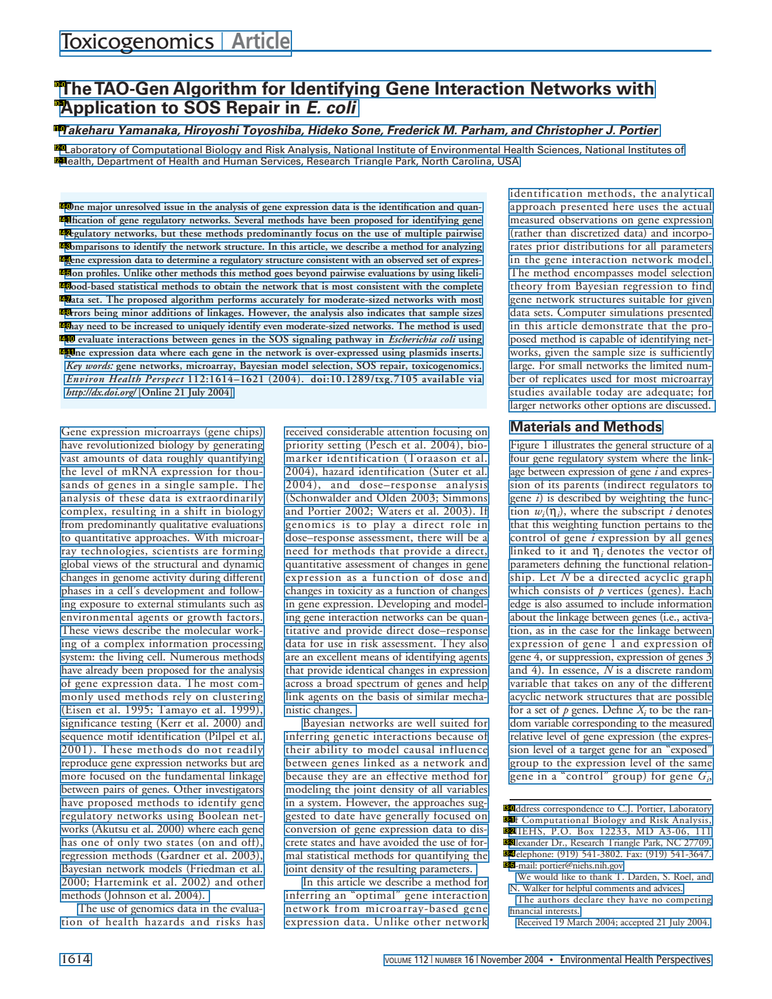

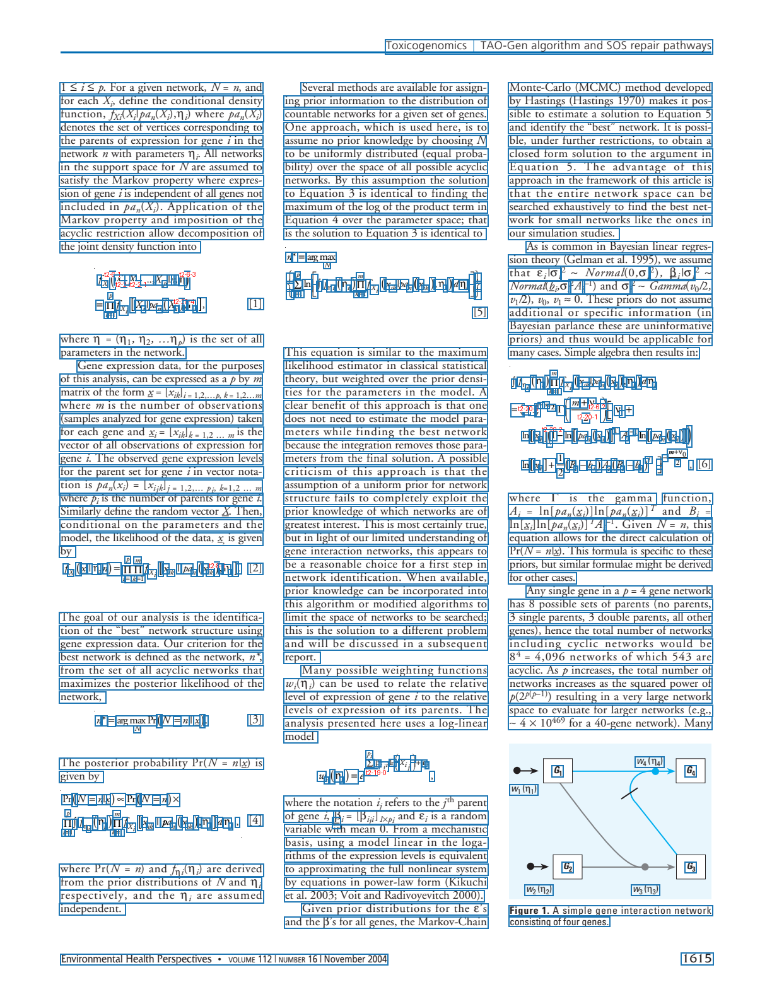

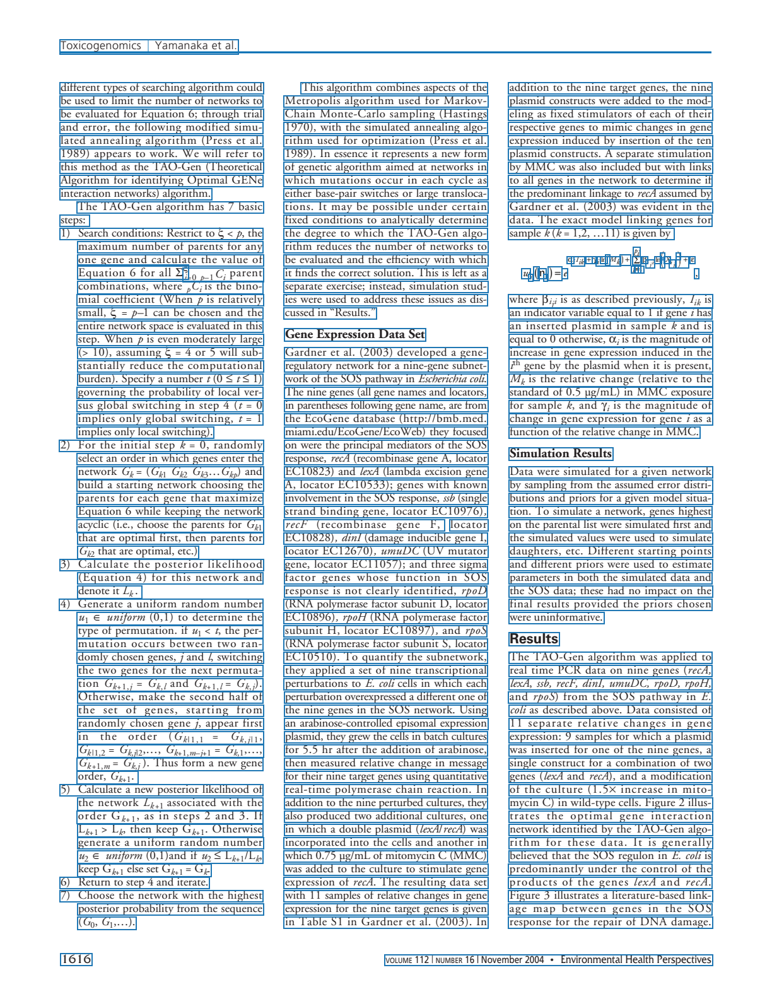

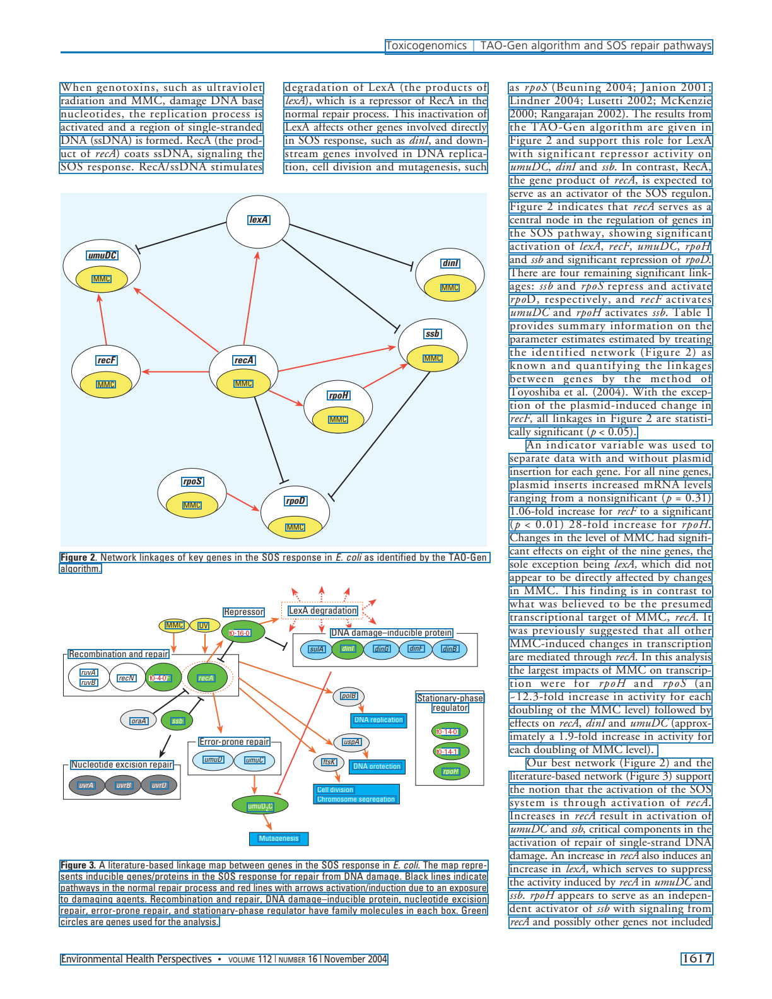

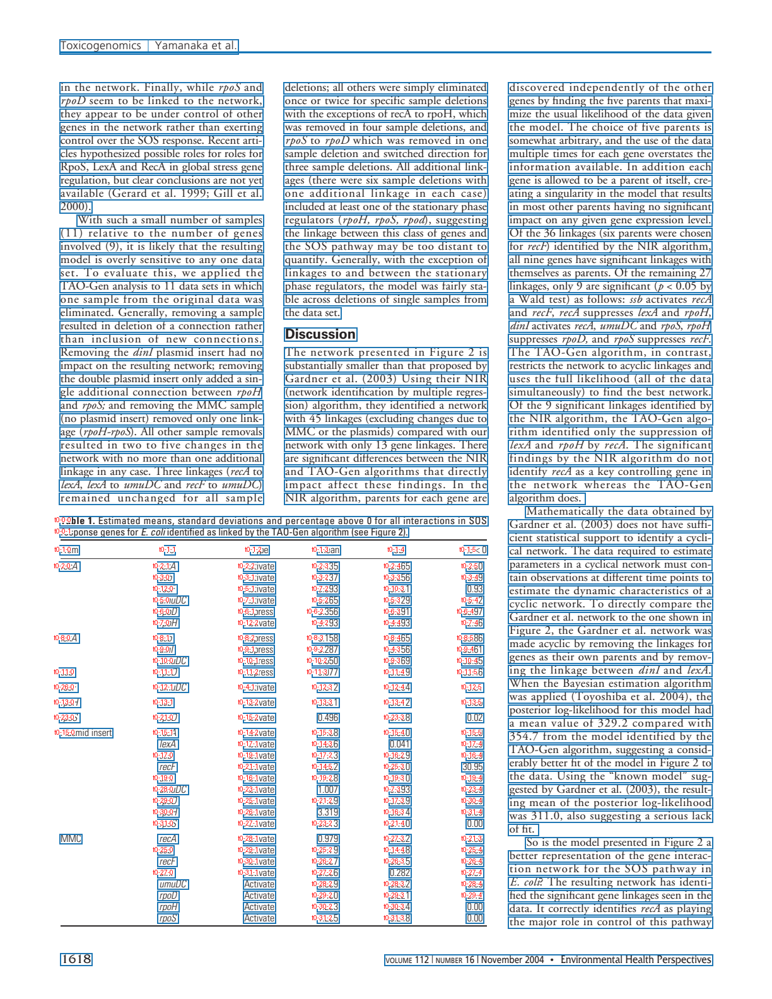

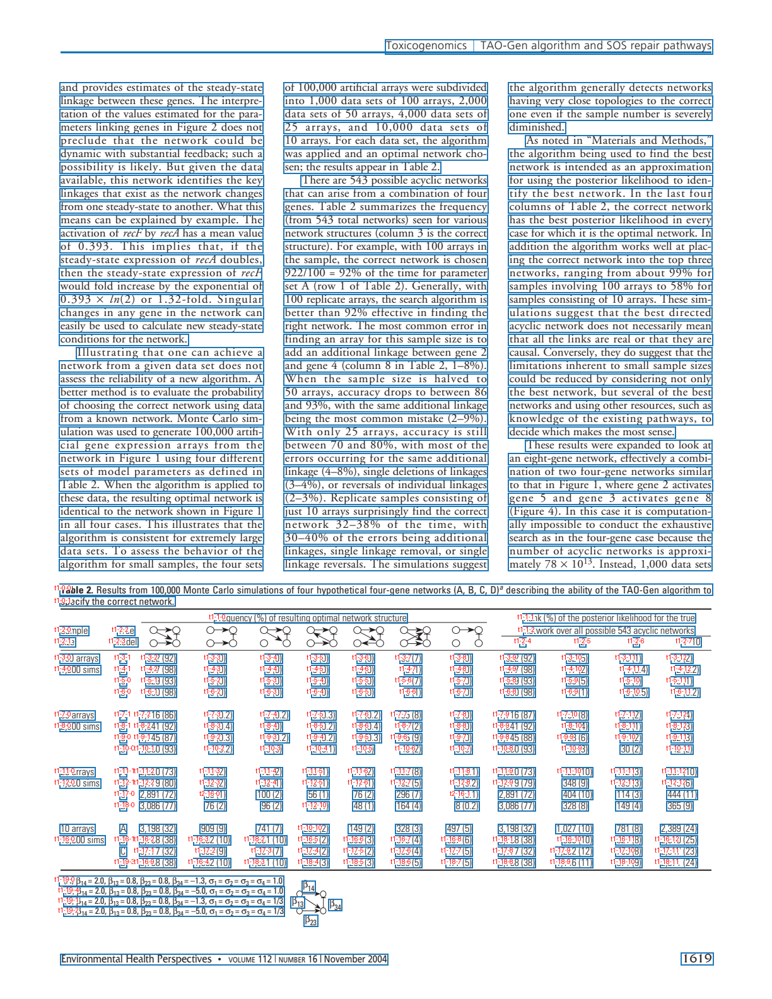

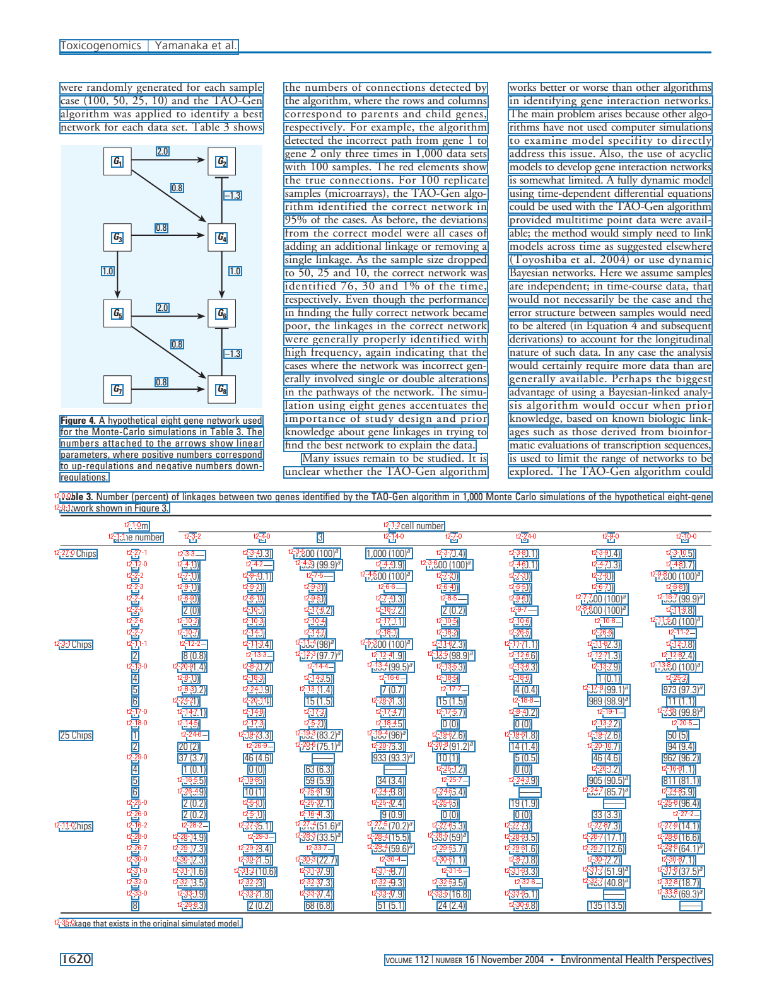

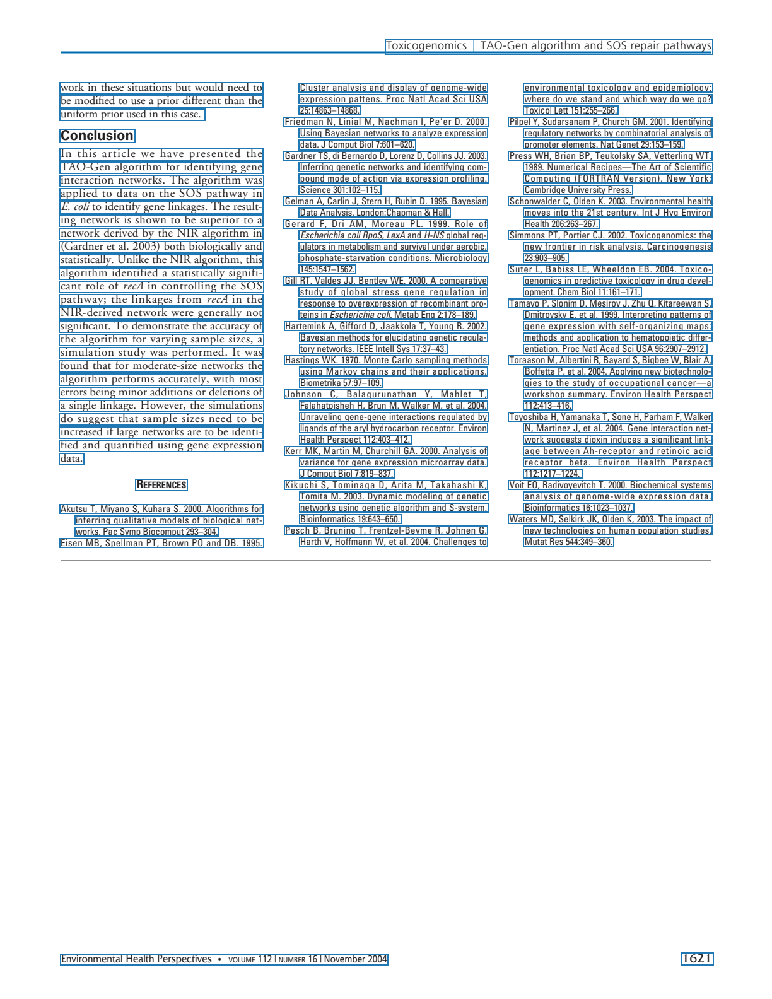

In [63]:
for page in show_annotations(doc.content, doc.content_boxes):
    display(page)